# 1. Obtener datos de yfinance

In [80]:
# Instalar librerías

# pip install yfinance
# pip install plotly
# pip install pandas
# pip install numpy
# pip install seaborn

In [81]:
# Importar librerías
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import seaborn as sns
import datetime
import pickle

In [82]:
# Definir parámetros
ric = 'NQ=F' # 'NQ=F', 'TSLA', 'NVDA', 'AAPL' '^IBEX', 'AMZN', 'BTC=F', 'CL=F', 'EURUSD=X', 'GBPUSD=X', 'BTC-EUR'
interval = '1h' # Valid intervals: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo Intraday data cannot extend last 60 days
period = '730d' # period= 1d,5d,1mo,3mo,6mo,1y,2y,5y,10y,ytd,max

ticker = yf.Ticker(ric)
data = ticker.history(interval=interval, period=period)

In [83]:
# # Definir las fechas de inicio y fin
# start_date = datetime.datetime.now() - datetime.timedelta(days=7)
# end_date = datetime.datetime.now()

# # Obtener los datos históricos con intervalo de 1 minuto utilizando yfinance
# data = yf.download(ric, interval='1m', start=start_date, end=end_date)

In [84]:
# Guardar dataframe
data.to_csv(r'..\data\raw\dataset.csv')

# 2. Estudio del dato

In [85]:
# Tipo de variable
type(data)

pandas.core.frame.DataFrame

In [86]:
# Info del dato
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13793 entries, 2021-02-14 18:00:00-05:00 to 2023-06-29 12:00:00-04:00
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          13793 non-null  float64
 1   High          13793 non-null  float64
 2   Low           13793 non-null  float64
 3   Close         13793 non-null  float64
 4   Volume        13793 non-null  int64  
 5   Dividends     13793 non-null  float64
 6   Stock Splits  13793 non-null  float64
dtypes: float64(6), int64(1)
memory usage: 862.1 KB


In [87]:
# Datos
data

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-02-14 18:00:00-05:00,13829.50,13844.00,13810.00,13826.00,2873,0.0,0.0
2021-02-14 19:00:00-05:00,13825.50,13863.25,13823.00,13858.50,5344,0.0,0.0
2021-02-14 20:00:00-05:00,13857.75,13866.50,13846.50,13853.00,2960,0.0,0.0
2021-02-14 21:00:00-05:00,13853.00,13857.50,13847.00,13847.75,1986,0.0,0.0
2021-02-14 22:00:00-05:00,13848.00,13853.75,13846.00,13851.00,1907,0.0,0.0
...,...,...,...,...,...,...,...
2023-06-29 08:00:00-04:00,15181.50,15202.75,15127.50,15138.50,24875,0.0,0.0
2023-06-29 09:00:00-04:00,15139.00,15145.75,15078.00,15098.25,101792,0.0,0.0
2023-06-29 10:00:00-04:00,15098.50,15132.50,15028.50,15069.25,122667,0.0,0.0


In [88]:
# Convertir string a minúsculas
data.columns = data.columns.str.lower()
data = data.loc[:, 'open':'close']

In [89]:
# Descripción de los datos
data.describe()

,open,high,low,close
count,13793.000000,13793.000000,13793.000000,13793.000000
mean,13510.943504,13536.712263,13483.462151,13511.033445
std,1500.368189,1497.650353,1502.750962,1500.446142
min,10542.000000,10629.750000,10484.750000,10543.000000
25%,12233.250000,12268.000000,12197.500000,12233.000000
50%,13392.750000,13425.000000,13362.500000,13394.000000
75%,14767.750000,14790.500000,14741.000000,14767.750000
max,16721.750000,16767.500000,16690.000000,16721.500000


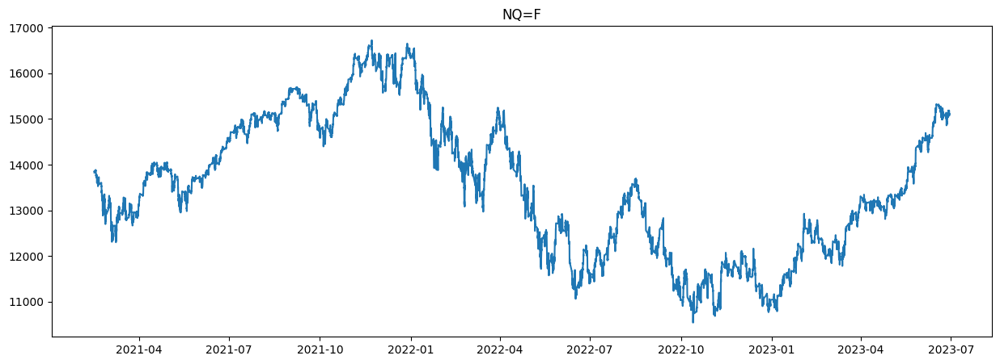

In [90]:
# Plot precio
plt.figure(figsize=(15,5))
plt.plot(data.index, data['close'])
plt.title(f'{ric}')
plt.show()

# 3. Retornos

### 1. Cálculo del retorno al cierre en %

In [91]:
data['return_close'] = data['close'] / data['close'].shift(1) - 1
data

,open,high,low,close,return_close
Datetime,,,,,
2021-02-14 18:00:00-05:00,13829.50,13844.00,13810.00,13826.00,NaN
2021-02-14 19:00:00-05:00,13825.50,13863.25,13823.00,13858.50,0.002351
2021-02-14 20:00:00-05:00,13857.75,13866.50,13846.50,13853.00,-0.000397
2021-02-14 21:00:00-05:00,13853.00,13857.50,13847.00,13847.75,-0.000379
2021-02-14 22:00:00-05:00,13848.00,13853.75,13846.00,13851.00,0.000235
...,...,...,...,...,...
2023-06-29 08:00:00-04:00,15181.50,15202.75,15127.50,15138.50,-0.002882
2023-06-29 09:00:00-04:00,15139.00,15145.75,15078.00,15098.25,-0.002659
2023-06-29 10:00:00-04:00,15098.50,15132.50,15028.50,15069.25,-0.001921


In [92]:
# # Retrasar 'Return' una posición y eliminar última fila
# data['return_close'] = data['return_close'].shift(-1)
# data.drop(index=data.index[-1], inplace=True)

In [93]:
data['return_close'].describe()

count    13792.000000
mean         0.000012
std          0.003287
min         -0.035537
25%         -0.001111
50%          0.000054
75%          0.001251
max          0.039183
Name: return_close, dtype: float64

### 2. Plots

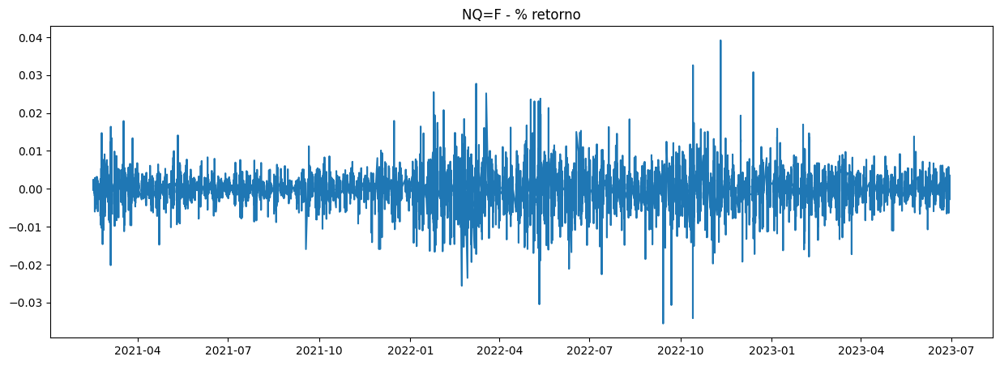

In [94]:
# Plot retornos 

plt.figure(figsize=(15,5))
plt.plot(data['return_close'])
plt.title(f'{ric} - % retorno')
plt.show()


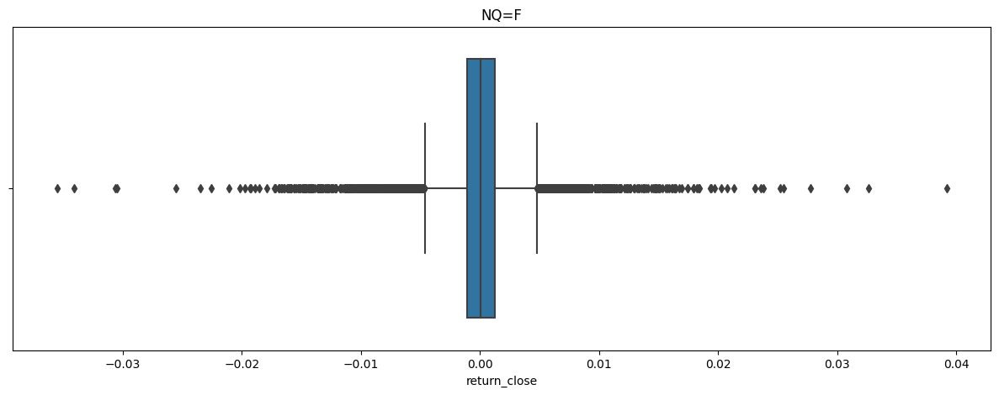

In [95]:
# Boxplot
plt.figure(figsize=(15,5))
sns.boxplot(x=data['return_close'])
plt.title(f'{ric}')
plt.show()

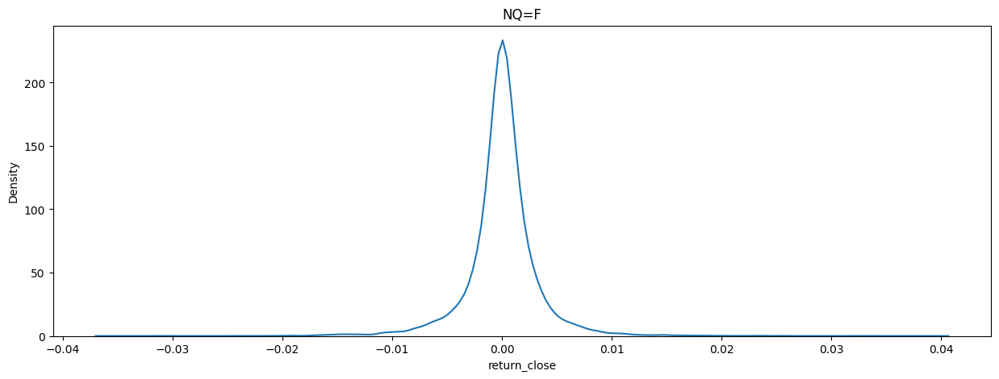

In [96]:
# KDE plot
plt.figure(figsize=(15,5))
sns.kdeplot(data['return_close'])
plt.title(f'{ric}')
plt.show()

# 4 Medias móviles

### 1. Cálculo

In [97]:
# Definir las medias móviles
medias_moviles = [8, 21, 30, 50, 100, 200]

# Calcular las medias móviles
for ma in medias_moviles:
    columna = 'MA_' + str(ma)  # Nombre de la columna de la media móvil
    data[columna] = data['close'].rolling(window=ma).mean()

### 2. Plot

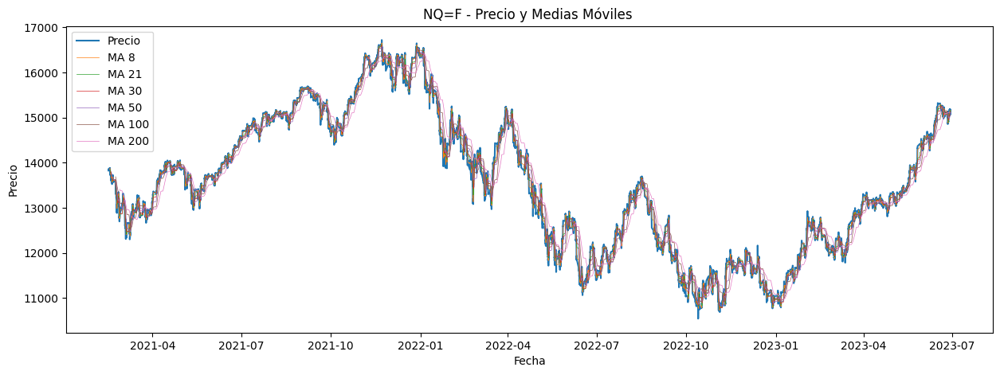

In [98]:
# Graficar el precio y las medias móviles
plt.figure(figsize=(15, 5))
plt.plot(data['close'], label='Precio')
for ma in medias_moviles:
    columna = 'MA_' + str(ma)
    plt.plot(data[columna], label='MA ' + str(ma), linewidth=0.5)

plt.xlabel('Fecha')
plt.ylabel('Precio')
plt.title(f'{ric} - Precio y Medias Móviles ')
plt.legend()
plt.show()

### 3. Matriz de correlación

In [99]:
# Filtrar las columnas que contienen 'Derivada' y la columna 'close'
columnas_derivadas = data.filter(like='MA')
columnas_seleccionadas = columnas_derivadas.columns.tolist() + ['return_close']

# Calcular la matriz de correlación
correlation_matrix = data[columnas_seleccionadas].corr()

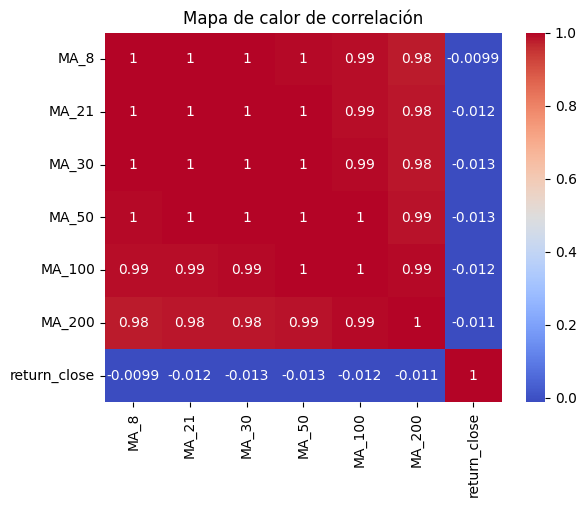

In [100]:
# Crear un mapa de calor de correlación
plt.figure()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Configurar el título del gráfico
plt.title('Mapa de calor de correlación')

# Mostrar el gráfico
plt.show()

In [101]:
# Máscara booleana 'positive_returns'
data['positive_returns'] = data['return_close'] > 0

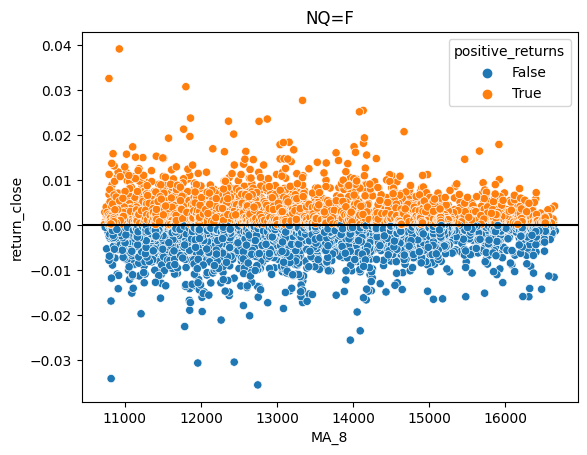

In [102]:
# Crear el scatterplot
sns.scatterplot(x=data['MA_8'], y=data['return_close'], hue=data['positive_returns'])

# Trazar una línea en y=0
plt.axhline(0, color='black', linestyle='-')

# Mostrar el gráfico
plt.title(f'{ric}')
plt.show()

# 5. Máscaras 1

### 1. Definición

In [103]:
# Definir máscaras
data['MA_UP'] = np.where((data['MA_8'] > data['MA_21']),
                        # (data['MA_21'] > data['MA_30']) &
                        # (data['MA_30'] > data['MA_50']) &
                        # (data['MA_50'] > data['MA_100']) &
                        # (data['MA_100'] > data['MA_200']),
                        True,
                        False)

data['MA_DOWN'] = np.where((data['MA_8'] < data['MA_21']),
                        # (data['MA_21'] < data['MA_30']) &
                        # (data['MA_30'] < data['MA_50']) &
                        # (data['MA_50'] < data['MA_100']) &
                        # (data['MA_100'] < data['MA_200']),
                        True,
                        False)

### 2. Retornos agregados

Filtrados por las máscaras

In [104]:
return_agg = data['return_close'][data['MA_UP']].sum() - data['return_close'][data['MA_DOWN']].sum()
return_agg

2.4766042800781127

Retorno del periodo

In [105]:
return_period = data['close'].iloc[-1]/data['close'].iloc[0] - 1
return_period

0.09268768985968467

### 3. Gráfico

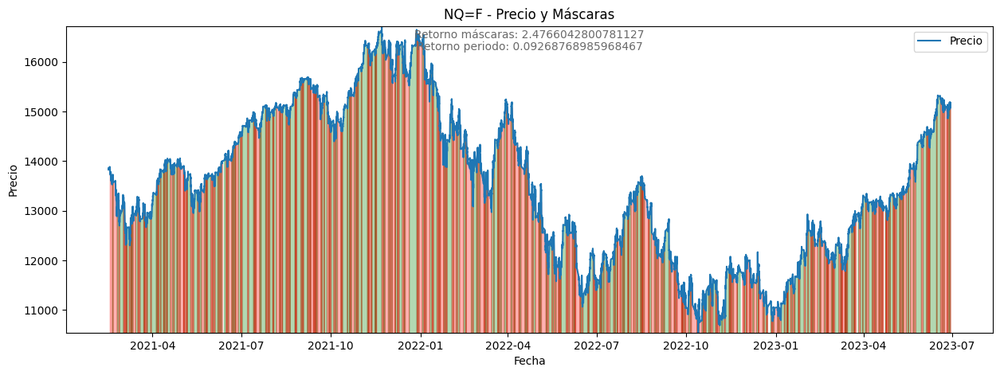

In [106]:
# Graficar el precio y las máscaras
plt.figure(figsize=(15, 5))
plt.plot(data['close'], label='Precio')

# Rellenar el área entre la línea y el eje x cuando 'MA_UP' es igual a 1
plt.fill_between(data.index, data['close'], where=data['MA_UP'], color='green', alpha=0.3)
plt.fill_between(data.index, data['close'], where=data['MA_DOWN'], color='red', alpha=0.3)

plt.xlabel('Fecha')
plt.ylabel('Precio')
plt.title(f'{ric} - Precio y Máscaras')
plt.ylim(data['close'].min(), data['close'].max())
plt.text(x=0.5, y=0.99, s=f'Retorno máscaras: {return_agg}', transform=plt.gca().transAxes,
                fontsize=10, va='top', ha='center', color='dimgray')
plt.text(x=0.5, y=0.95, s=f'Retorno periodo: {return_period}', transform=plt.gca().transAxes,
                fontsize=10, va='top', ha='center', color='dimgray')
plt.legend()
plt.show()

# 6. Derivadas

### 1. Cáclulo

In [107]:
# Calcular las derivadas
for ma in medias_moviles:
    columna_ma = 'MA_' + str(ma)
    columna_derivada = 'Derivada_' + str(ma)
    data[columna_derivada] = data[columna_ma].diff()

data.loc[:, 'Derivada_8':'Derivada_200'].describe()

,Derivada_8,Derivada_21,Derivada_30,Derivada_50,Derivada_100,Derivada_200
count,13785.000000,13772.000000,13763.000000,13743.000000,13693.000000,13593.000000
mean,0.092719,0.094815,0.095950,0.096953,0.099568,0.125454
std,15.184540,9.399007,7.818487,6.010757,4.095802,2.837619
min,-99.312500,-44.535714,-32.541667,-27.075000,-14.790000,-10.075000
25%,-6.687500,-5.142857,-4.266667,-3.445000,-2.325000,-1.732500
50%,0.750000,0.571429,0.391667,0.360000,0.322500,0.505000
75%,7.593750,5.892857,5.025000,4.110000,2.840000,2.192500
max,110.375000,42.309524,36.108333,23.495000,13.750000,8.726250


In [108]:
data

,open,high,low,close,return_close,MA_8,MA_21,MA_30,MA_50,MA_100,MA_200,positive_returns,MA_UP,MA_DOWN,Derivada_8,Derivada_21,Derivada_30,Derivada_50,Derivada_100,Derivada_200
Datetime,,,,,,,,,,,,,,,,,,,,
2021-02-14 18:00:00-05:00,13829.50,13844.00,13810.00,13826.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN
2021-02-14 19:00:00-05:00,13825.50,13863.25,13823.00,13858.50,0.002351,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,NaN,NaN,NaN,NaN,NaN,NaN
2021-02-14 20:00:00-05:00,13857.75,13866.50,13846.50,13853.00,-0.000397,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN
2021-02-14 21:00:00-05:00,13853.00,13857.50,13847.00,13847.75,-0.000379,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN
2021-02-14 22:00:00-05:00,13848.00,13853.75,13846.00,13851.00,0.000235,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-29 08:00:00-04:00,15181.50,15202.75,15127.50,15138.50,-0.002882,15156.96875,15152.190476,15127.250000,15086.255,15053.5825,15119.79750,False,True,False,-1.12500,-1.880952,2.275000,4.610,0.0200,-0.36125
2023-06-29 09:00:00-04:00,15139.00,15145.75,15078.00,15098.25,-0.002659,15150.62500,15148.119048,15128.591667,15089.875,15053.0625,15119.24875,False,True,False,-6.34375,-4.071429,1.341667,3.620,-0.5200,-0.54875
2023-06-29 10:00:00-04:00,15098.50,15132.50,15028.50,15069.25,-0.001921,15142.18750,15147.285714,15128.816667,15092.680,15052.2400,15118.49125,False,False,True,-8.43750,-0.833333,0.225000,2.805,-0.8225,-0.75750


### 2. Plots

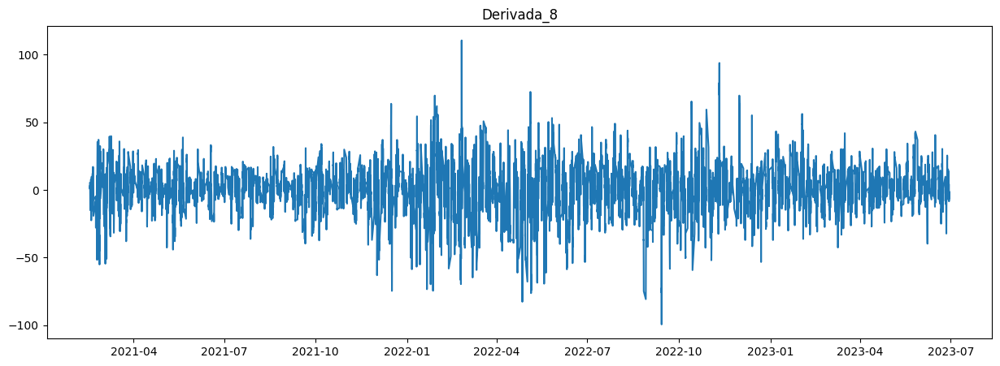

In [109]:
# Plot derivada
ma = 8

plt.figure(figsize=(15,5))
plt.plot(data[f'Derivada_{ma}'])

plt.title(f'Derivada_{ma}')
plt.show()

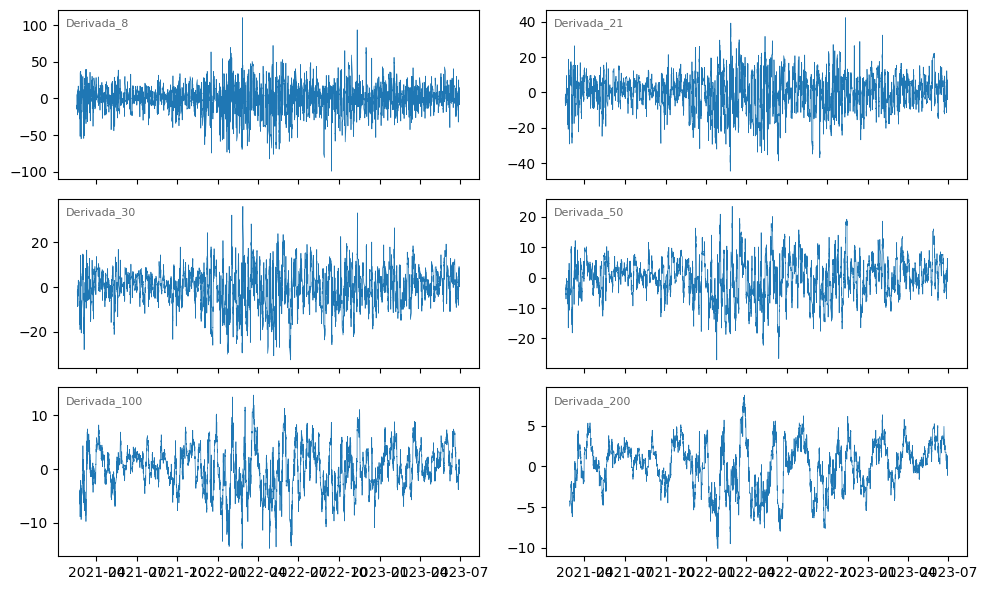

In [110]:
# Polt derivadas

# Filtrar las columnas por el nombre que contiene "Derivada"
columnas_derivadas = data.filter(like='Derivada')

# Obtener el número de derivadas de las medias móviles
num_derivadas = len(columnas_derivadas.columns)

# Calcular el número de filas y columnas para la cuadrícula de subplots
num_filas = (num_derivadas + 1) // 2
num_columnas = 2

# Crear una figura y una cuadrícula de subplots con dos columnas
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 6), sharex=True)

# Aplanar el arreglo de subplots para iterar sobre ellos
axs = axs.flatten()

# Iterar sobre las columnas de derivadas de las medias móviles y agregarlas a los subplots
for i, columna in enumerate(columnas_derivadas.columns):
    axs[i].plot(data[columna], linewidth=0.5)  # Ajustar el grosor de la línea
    axs[i].text(0.02, 0.95, columna, transform=axs[i].transAxes,
                fontsize=8, va='top', ha='left', color='dimgray')

# Ajustar los espacios entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

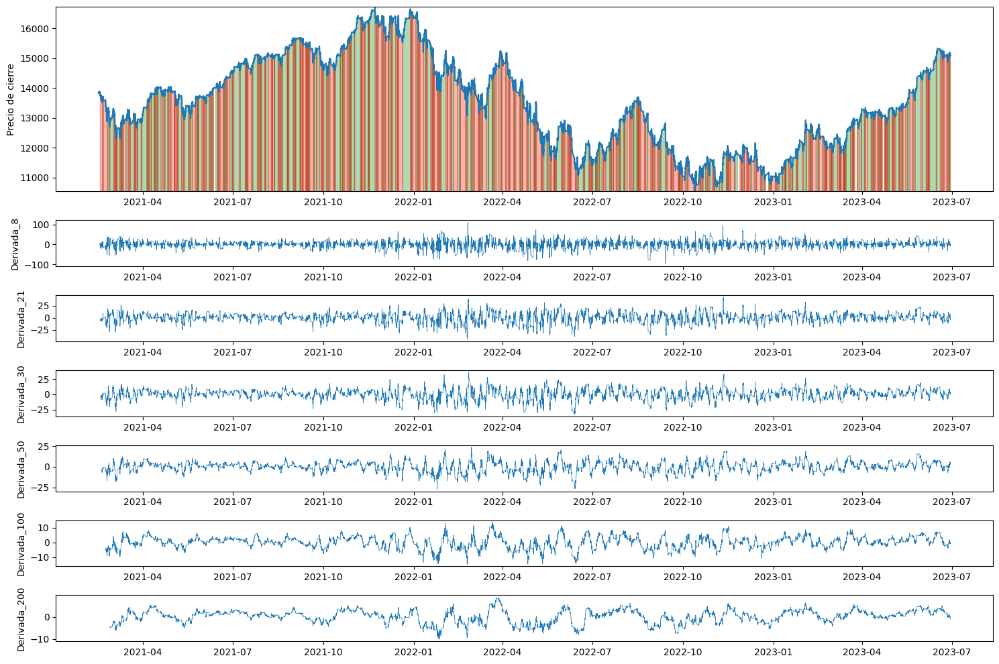

In [111]:
# Grafico del precio con máscaras y derivadas

# Filtrar las columnas por el nombre que contiene "Derivada"
columnas_derivadas = data.filter(like='Derivada')

# Obtener el número de derivadas de las medias móviles
num_derivadas = len(columnas_derivadas.columns)

# Crear una figura y una cuadrícula personalizada
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(num_derivadas + 1, 1, height_ratios=[4] + [1] * num_derivadas)

# Trazar el precio de cierre en el primer subplot con altura mayor
ax1 = plt.subplot(gs[0])
ax1.plot(data['close'])

# Rellenar el área entre la línea y el eje x cuando 'MA_UP' es igual a 1
ax1.fill_between(data.index, data['close'], where=data['MA_UP'], color='green', alpha=0.3)
ax1.fill_between(data.index, data['close'], where=data['MA_DOWN'], color='red', alpha=0.3)

ax1.set_ylabel('Precio de cierre')
ax1.set_ylim(data['close'].min(), data['close'].max())

# Iterar sobre las columnas de derivadas de las medias móviles y agregarlas a los subplots individuales
for i, columna in enumerate(columnas_derivadas.columns):
    ax = plt.subplot(gs[i + 1], sharex=ax1)
    ax.plot(data.index, data[columna], linewidth=0.5)  # Ajustar el grosor de la línea
    ax.set_ylabel(columna)

# Ajustar los espacios entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

### 3. Matriz de correlación

In [112]:
# Filtrar las columnas que contienen 'Derivada' y la columna 'close'
columnas_derivadas = data.filter(like='Derivada')
columnas_seleccionadas = columnas_derivadas.columns.tolist() + ['return_close']

# Calcular la matriz de correlación
correlation_matrix = data[columnas_seleccionadas].corr()

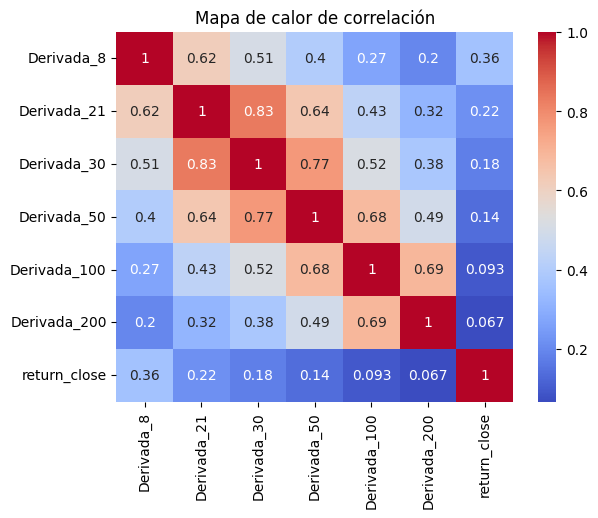

In [113]:
# Crear un mapa de calor de correlación
plt.figure()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Configurar el título del gráfico
plt.title('Mapa de calor de correlación')

# Mostrar el gráfico
plt.show()

### 4. Scatter plot

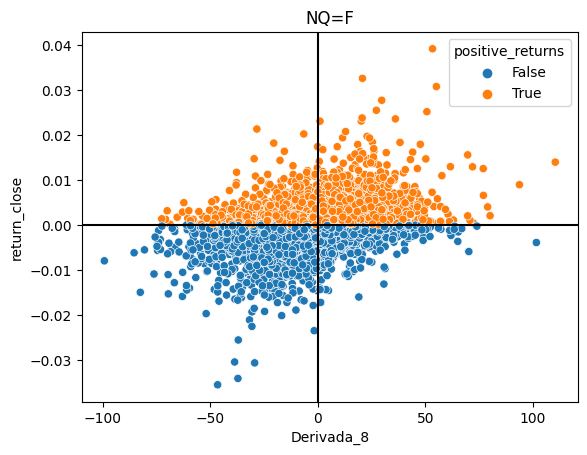

In [114]:
# Crear el scatterplot
sns.scatterplot(x=data['Derivada_8'], y=data['return_close'], hue=data['positive_returns'])

# Trazar una línea en y=0
plt.axhline(0, color='black', linestyle='-')

# Trazar una línea en x=0
plt.axvline(0, color='black', linestyle='-')

# Mostrar el gráfico
plt.title(f'{ric}')
plt.show()

### 5. Regresión lineal

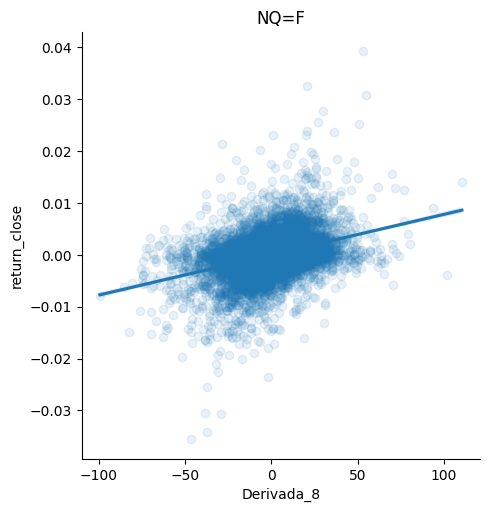

In [115]:
# Regresión lineal
sns.lmplot(data=data, x='Derivada_8', y='return_close', scatter_kws={'alpha': 0.1})
plt.title(f'{ric}')

plt.show()

### 6. Estimación de Densidad de Kernel

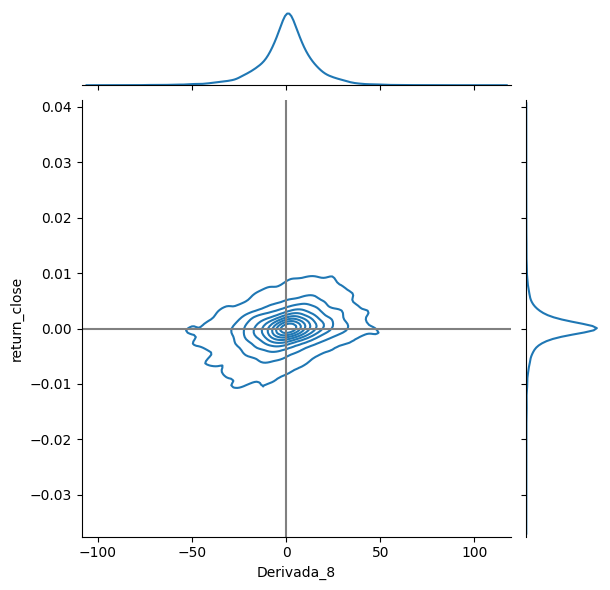

In [116]:
# KDE

sns.jointplot(x=data['Derivada_8'], y=data['return_close'], kind='kde');

# Trazar una línea en y=0
plt.axhline(0, color='gray', linestyle='-')

# Trazar una línea en x=0
plt.axvline(0, color='gray', linestyle='-')

plt.show()

# 7. Máscaras 2

### 1. Definición

In [117]:
# Definir máscaras
data['MA_UP'] = np.where(#(data['MA_8'] > data['MA_21']) &
                        # (data['MA_21'] > data['MA_30']) &
                        # (data['MA_30'] > data['MA_50']) &
                        # (data['MA_50'] > data['MA_100']) &
                        # (data['MA_100'] > data['MA_200']) &
                        (data['Derivada_8'] > 0),
                        True,
                        False)

data['MA_DOWN'] = np.where(#(data['MA_8'] < data['MA_21']) &
                        # (data['MA_21'] < data['MA_30']) &
                        # (data['MA_30'] < data['MA_50']) &
                        # (data['MA_50'] < data['MA_100']) &
                        # (data['MA_100'] < data['MA_200']) &
                        (data['Derivada_8'] < 0),
                        True,
                        False)

### 2. Retornos agregados

In [118]:
# Retorno 'MA_UP'
data['return_close'][data['MA_UP']].sum()

6.166139801780062

In [119]:
# Retorno 'MA_DOWN'
data['return_close'][data['MA_DOWN']].sum()

-6.017459412371807

In [120]:
# Retorno agregado
return_agg = data['return_close'][data['MA_UP']].sum() - data['return_close'][data['MA_DOWN']].sum()
return_agg

12.183599214151869

In [121]:
# Retorno del periodo
return_abs = data['close'].iloc[-1]/data['close'].iloc[0] - 1
return_abs

0.09268768985968467

### 3. Gráfica

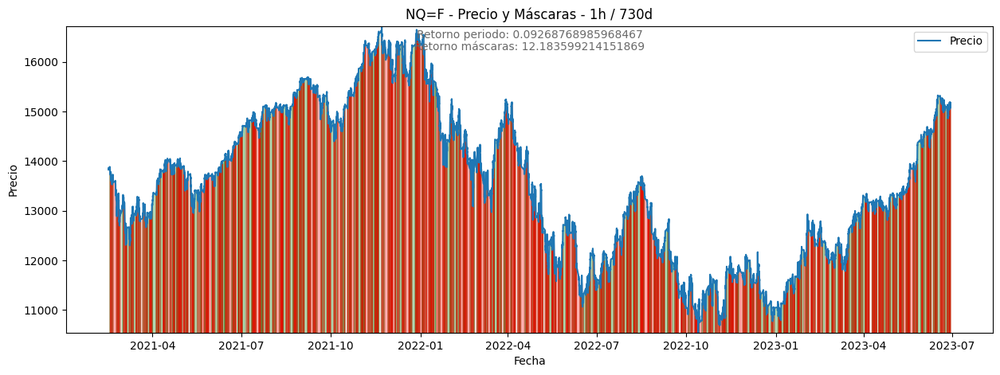

In [122]:
# Graficar el precio y las medias móviles
plt.figure(figsize=(15, 5))
plt.plot(data['close'], label='Precio')

# Rellenar el área entre la línea y el eje x cuando 'MA_UP' es igual a 1
plt.fill_between(data.index, data['close'], where=data['MA_UP'], color='green', alpha=0.3)
plt.fill_between(data.index, data['close'], where=data['MA_DOWN'], color='red', alpha=0.3)

plt.xlabel('Fecha')
plt.ylabel('Precio')
plt.title(f'{ric} - Precio y Máscaras - {interval} / {period}')
plt.ylim(data['close'].min(), data['close'].max())
plt.text(x=0.5, y=0.99, s=f'Retorno periodo: {return_period}', transform=plt.gca().transAxes,
                fontsize=10, va='top', ha='center', color='dimgray')
plt.text(x=0.5, y=0.95, s=f'Retorno máscaras: {return_agg}', transform=plt.gca().transAxes,
                fontsize=10, va='top', ha='center', color='dimgray')
plt.legend()
plt.show()

# 8. Estudio de las series obtenidas

In [123]:
# Contar series positivas y numerarlas

# Inicializar variables
serie_actual = 0
series_numeradas = []

# Recorrer el DataFrame con la máscara booleana
for i, estado_actual in enumerate(data['MA_UP']):
    if i > 0 and estado_actual and not data['MA_UP'].iloc[i-1]:
        # Si el estado cambia a True, se inicia una nueva serie
        serie_actual += 1
    # Si el estado es False, el número de serie es 0
    serie = serie_actual if estado_actual else 0
    # Guardar el número de serie en la columna 'UP_series'
    series_numeradas.append(serie)

# Agregar la columna 'UP_series' al DataFrame
data['UP_series'] = series_numeradas

In [124]:
# Visualizar series positivas
grouped_UP = data[['UP_series','return_close']].groupby(data['UP_series']).agg('sum')
print(grouped_UP['return_close'][1:].sum())
print(grouped_UP)


6.166139801780062
           UP_series  return_close
UP_series                         
0                  0     -6.002956
1                  6     -0.000377
2                  2      0.000691
3                 12     -0.001140
4                 24     -0.003006
...              ...           ...
1162            2324     -0.000514
1163            1163      0.001413
1164           10476      0.009243
1165            4660     -0.001863
1166            3498      0.001583

[1167 rows x 2 columns]


In [125]:
# Contar series negativas y numerarlas

# Inicializar variables
serie_actual = 0
series_numeradas = []

# Recorrer el DataFrame con la máscara booleana
for i, estado_actual in enumerate(data['MA_DOWN']):
    if i > 0 and estado_actual and not data['MA_DOWN'].iloc[i-1]:
        # Si el estado cambia a True, se inicia una nueva serie
        serie_actual += 1
    # Si el estado es False, el número de serie es 0
    serie = serie_actual if estado_actual else 0
    # Guardar el número de serie en la columna 'DOWN_series'
    series_numeradas.append(serie)

# Agregar la columna 'DOWN_series' al DataFrame
data['DOWN_series'] = series_numeradas

In [126]:
# Visualizar series negativas
grouped_DOWN = data[['DOWN_series','return_close']].groupby(data['DOWN_series']).agg('sum')
print(grouped_DOWN['return_close'][1:].sum())
print(grouped_DOWN)


-6.017459412371807
             DOWN_series  return_close
DOWN_series                           
0                      0      6.180643
1                     13     -0.008760
2                      4     -0.000545
3                     33     -0.003066
4                     60     -0.004231
...                  ...           ...
1163                2326     -0.001343
1164                2328     -0.001278
1165                2330     -0.000494
1166                4664      0.000711
1167                5835     -0.004919

[1168 rows x 2 columns]


# 9. Plotly

### 1. Plots

In [135]:
# Definir los colores para las medias móviles
colores = ['orange', 'blue', 'grey', 'green', 'purple', 'red']

# Crear la figura de Plotly
fig = go.Figure()

# Agregar el precio al gráfico
fig.add_trace(go.Scatter(x=data.index, y=data['close'], name='Precio', line=dict(color='blue', width=1)))

# Agregar las medias móviles al gráfico con colores diferentes
for ma, color in zip(medias_moviles, colores):
    columna = 'MA_' + str(ma)
    fig.add_trace(go.Scatter(x=data.index, y=data[columna], name='MA ' + str(ma), line=dict(color=color, width=0.5)))

# Personalizar el diseño del gráfico
fig.update_layout(
    title={'text': f'{ric} · Precio y Medias Móviles', 'x': 0.5, 'xanchor': 'center'},
    xaxis_title='Fecha',
    yaxis_title='Precio',
)

# Mostrar el gráfico interactivo
fig.show()

# Guardar gráfica
with open(r'..\plots\plotly.pkl', 'wb') as f:
    pickle.dump(fig, f)

In [ ]:
from plotly.subplots import make_subplots

# Filtrar las columnas por el nombre que contiene "Derivada"
columnas_derivadas = data.filter(like='Derivada')

# Obtener el número de derivadas de las medias móviles
num_derivadas = len(columnas_derivadas.columns)

# Definir la altura del primer gráfico y el resto de los gráficos
row_heights = [0.8] + [0.2] * num_derivadas

# Crear los subplots con eje x compartido
fig = make_subplots(rows=num_derivadas + 1, cols=1, shared_xaxes=True, vertical_spacing=0.05, row_heights=row_heights)

# Trazar el precio de cierre en el primer subplot con altura mayor
fig.add_trace(go.Scatter(x=data.index, y=data['close'], name='Precio de cierre'), row=1, col=1)

fig.update_layout(height=800, width=1000, title_text=f'{ric} - Precio y Derivadas')

# Iterar sobre las columnas de derivadas de las medias móviles y agregarlas a los subplots individuales
for i, columna in enumerate(columnas_derivadas.columns):
    fig.add_trace(go.Scatter(x=data.index, y=data[columna], name=columna), row=i+2, col=1)

fig.show()

In [ ]:
# Guardar dataframe
# data.to_csv(f'df_{ric}.csv')

# 10. Continuara..

In [ ]:
# Plotly con máscaras

# Crear una figura
fig = go.Figure()

# Agregar la línea principal
fig.add_trace(go.Scatter(x=data.index, y=data['close'], mode='lines', name='Close'))

# Rellenar el área entre la línea y el eje x cuando 'MA_UP' es igual a 1
fig.add_trace(go.Scatter(x=data.index, y=data['close'], fill='tozeroy', fillcolor='green',
                         line=dict(color='green'), name='MA_UP',
                         connectgaps=True, showlegend=False,
                         hoverinfo='skip'))
fig.update_traces(visible='legendonly', selector=dict(fillcolor='green', y=data['MA_UP'] == 1))

# Rellenar el área entre la línea y el eje x cuando 'MA_DOWN' es igual a 1
fig.add_trace(go.Scatter(x=data.index, y=data['close'], fill='tozeroy', fillcolor='red',
                         line=dict(color='red'), name='MA_DOWN',
                         connectgaps=True, showlegend=False,
                         hoverinfo='skip'))
fig.update_traces(visible='legendonly', selector=dict(fillcolor='red', y=data['MA_DOWN'] == 1))

# Configurar el diseño del gráfico
fig.update_layout(title='Gráfico de precios', xaxis_title='Fecha', yaxis_title='Precio de cierre')

# Mostrar el gráfico
fig.show()

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [ ]:
# Slicing por fechas

# Año, mes y día de inicio y fin
start_year, start_month, start_day = 2023, 5, 23
end_year, end_month, end_day = 2023, 5, 26

# Convertir a objetos datetime
start_date = datetime.datetime(start_year, start_month, start_day)
end_date = datetime.datetime(end_year, end_month, end_day)

# Obtener los índices correspondientes a las fechas de inicio y fin
start_index = data.index.get_loc(start_date)
end_index = data.index.get_loc(end_date)

plt.figure(figsize=(15, 5))
plt.plot(data.index[start_index:end_index], data['close'][start_index:end_index])

# Rellenar el área entre la línea y el eje x cuando 'MA_UP' es igual a 1
plt.fill_between(data.index[start_index:end_index], data['close'][start_index:end_index], where=data['MA_UP'][start_index:end_index], color='green', alpha=0.3)
# Rellenar el área entre la línea y el eje x cuando 'MA_DOWN' es igual a 1
plt.fill_between(data.index[start_index:end_index], data['close'][start_index:end_index], where=data['MA_DOWN'][start_index:end_index], color='red', alpha=0.3)

plt.title(f'Gráfico de precios para {ric} ({start_date.strftime("%Y/%m/%d")} - {end_date.strftime("%Y/%m/%d")})')

plt.ylim(data['close'][start_index:end_index].min(), data['close'][start_index:end_index].max())

plt.show()

C:\Users\OY\AppData\Local\Temp\ipykernel_18668\926199608.py:12: FutureWarning:

Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.



KeyError: datetime.datetime(2023, 5, 23, 0, 0)